# AdaBoost

AdaBoost is short for adaptive boosting. AdaBoost trains a series of weak learners, with each subsequent classifier paying more attention to the training instances that were misclassified by its predecessors.

## What we will accomplish

In this notebook we will:
- Discuss the theoretical foundation of the AdaBoost algorithm,
- Demonstrate how to implement AdaBoost in `sklearn` and
- Provide references for you to learn more about AdaBoost.

In [12]:
## For data handling
import pandas as pd
import numpy as np

## For plotting
import matplotlib.pyplot as plt
from seaborn import set_style

## This sets the plot style
## to have a grid on a white background
set_style("whitegrid")

## How it works

AdaBoost (short for adaptive boosting) is an algorithm that builds a strong learner with an iterative sequence of weak learners.  While the ideas can be applied more generally we will address the case of binary classification.

Let $\mathcal{D} = (x_i,y_i)$ with $i = 1,2,3,...,N$ be our training data, with $x_i \in \mathbb{R}^p$ and $y_i \in \{-1,1\}$.  Let $X = \{x_i\}$.  Suppose that we have a parameterized collection of classifiers $C_\theta: \mathbb{R}^p \to \{-1,1\}$.  A common choice in AdaBoost is for $C_{j,t, \pm}$ to be a decision stump on feature $j$ with threshold $t$ (i.e. classify as $1$ if $\pm x_j > t$ and $-1$ else).

Our goal is to build a function $f : \mathbb{R}^p \to \mathbb{R}$ where $f(x) >> 0$ represents great confidence that $y = 1$ and $f(x) << 0$ represents great confidence that $y = -1$ (we will quantify this with a loss function soon).  We will build this function as a linear combination of weak classifiers:

$$
f = \sum_1^{j=1} \beta_j C_j
$$

Our goal is to minimize the exponential loss function

$$
L(f, y) = \sum_{i=1}^N \exp(-y_i f(x_i))
$$

A few notes about this loss function:

1. Each term is small when $y_i$ and $f(x_i)$ have the same sign, and $|f(x_i)|$ is large.
2. For a given $x$, assume that $(Y|x)$ is a Bernoulli random variable with probability $p$ of $Y=1$ and $(1-p)$ of $Y=-1$.  Then the value of $f(x)$ which minimizes the expected value of $\exp(-Yf(x))$ is $\frac{1}{2} \log\left( \frac{p}{1-p}\right)$.  So the population minimizer of $f(x)$ is half the log-odds of $(Y|x)$.

This is really cool:  we are building a probabilistic classifier out of a bunch of non-probabilistic classifiers. 

We approximate the minimizer $f$ using "forward stage-wise additive modeling": 

1. Select $\beta_1 = 1$ and $C_1$ to minimize $L(C_1, y)$.  Set $f_1 = C_1$. 
2. At stage $j > 1$ we will select $(\beta_j, C_j)$ to minimize $L(f_j, y)$ where $f_j = f_{j-1} + \beta_j C_j$.

Since 

$$
\begin{align*}
L(f_j, y) &= \sum_{i=1}^N \exp(-y_i f_{j-1}(x_i) - \beta_j y_i C_j(x_i))\\
            &= \sum_{i=1}^N \exp(-y_i f_{j-1}(x_i))\exp(- \beta_j y_i C_j(x_i))\\
            &= \sum_{i=1}^N w_i^j \exp(- \beta_j y_i C_j(x_i))\\
\end{align*}
$$

where $w_i^j = \exp(-y_i f_{j-1}(x_i))$ can be thought of as a weighting on the *samples* at stage $j$.

With a little Calculus one can show that for the $(\beta_j, C_j)$ pair which minimizes the loss:

* $C_j$ minimizes the *weighted error rate* 

$$\operatorname{err}_j = \frac{\displaystyle\sum_1^N w_i^j \mathbb{1}_{ C_j(x_i) \neq y_i}}{\displaystyle \sum_1^N w_i^j}$$

* $\beta_j = \frac{1}{2} \log(\frac{1 - \operatorname{err}_j}{\operatorname{err}_j})$ 

Note that the weighted error rate compels us to choose a classifier $C_j$ which "pays more attention" to those training examples which we were "confidently incorrect" about in the last stage.  A smaller $\operatorname{err}_j$ gives a larger $\beta_j$.

## In `sklearn`

Let's now demonstrate how to implement this algorithm as a classifier in `sklearn` with `AdaBoostClassifier`, <a href="https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html">https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html</a>. <i>For an adaptive boosting regression model check out `AdaBoostRegressor`, <a href="https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostRegressor.html">https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostRegressor.html</a>.</i>

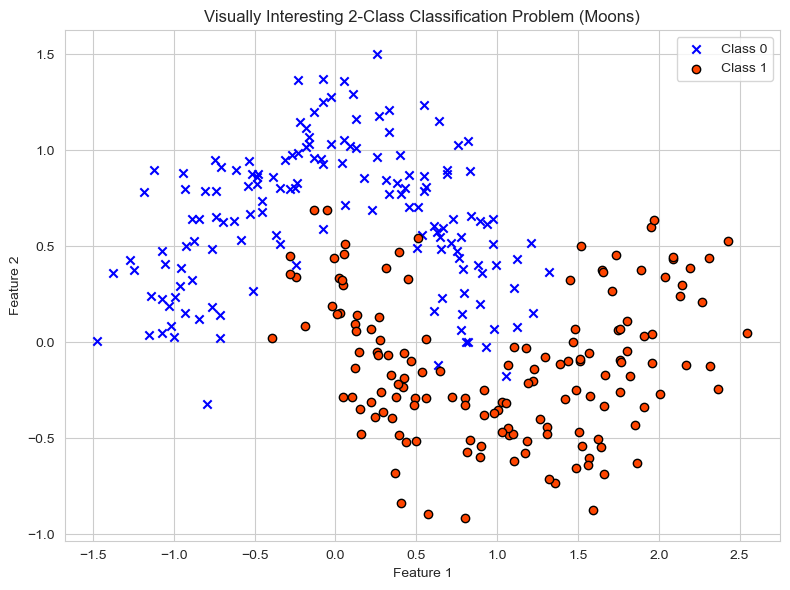

In [35]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_moons

X, y = make_moons(n_samples=300, noise=0.2, random_state=42)

plt.figure(figsize=(8, 6))
plt.scatter(X[y == 0][:, 0], X[y == 0][:, 1], color='dodgerblue', label='Class 0', facecolor='b', marker = 'x')
plt.scatter(X[y == 1][:, 0], X[y == 1][:, 1], color='orangered', label='Class 1', edgecolor='k', marker = 'o')
plt.title("Visually Interesting 2-Class Classification Problem (Moons)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

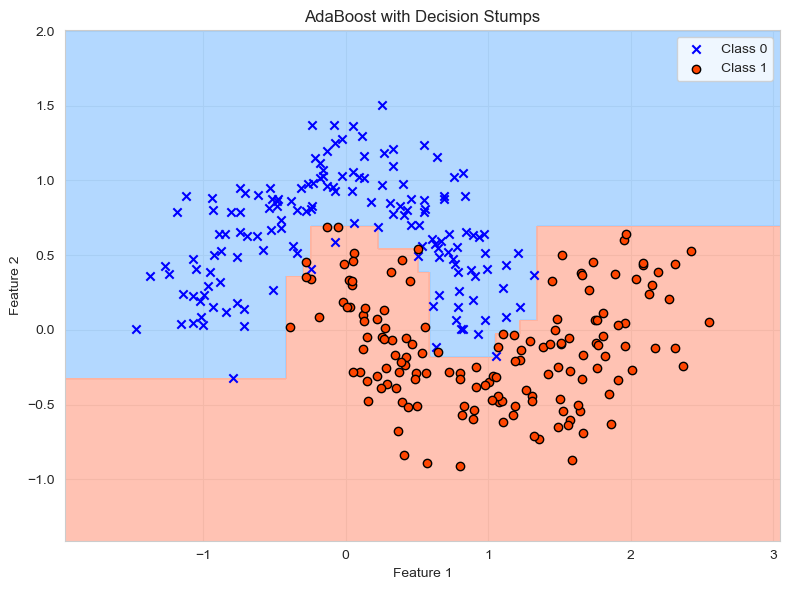

In [37]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from matplotlib.colors import ListedColormap

# Train AdaBoost classifier with decision stumps (depth=1 trees)
ada_clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=100, random_state=42)
ada_clf.fit(X, y)

# Plot decision boundary
x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500),
                     np.linspace(y_min, y_max, 500))
Z = ada_clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Create color maps
cmap_light = ListedColormap(['#a0cfff', '#ffb3a0'])
cmap_bold = ['dodgerblue', 'orangered']

# Plot decision boundary and points
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z, cmap=cmap_light, alpha=0.8)
plt.scatter(X[y == 0][:, 0], X[y == 0][:, 1], color=cmap_bold[0], label='Class 0', facecolor='b', marker = 'x')
plt.scatter(X[y == 1][:, 0], X[y == 1][:, 1], color=cmap_bold[1], label='Class 1', edgecolor='k')
plt.title("AdaBoost with Decision Stumps")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Here is a short animation of the changing decision boundaries as we add more terms to the ensemble:

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_moons
from matplotlib.colors import ListedColormap

# Dataset
X, y = make_moons(n_samples=300, noise=0.25, random_state=42)

# Train AdaBoost once
n_estimators = 100
ada = AdaBoostClassifier(
    DecisionTreeClassifier(max_depth=1),
    n_estimators=n_estimators,
    random_state=42
)
ada.fit(X, y)

# Meshgrid for decision regions
x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 300),
                     np.linspace(y_min, y_max, 300))
grid = np.c_[xx.ravel(), yy.ravel()]

# Colors
cmap = ListedColormap(['#AAAAFF', '#FFAAAA'])

# Create figure
fig, ax = plt.subplots(figsize=(6, 5))

# Animation update function
preds = list(ada.staged_predict(grid))
def update(frame):
    ax.clear()
    Z = preds[frame]
    Z = Z.reshape(xx.shape)
    contour = ax.contourf(xx, yy, Z, alpha=0.6, levels=np.linspace(0, 1, 20), cmap='coolwarm')
    ax.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap, edgecolor='k')
    ax.set_title(f"AdaBoost Probability Map: {frame + 1} Estimator(s)")
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xlabel("Feature 1")
    ax.set_ylabel("Feature 2")

# Animate
ani = animation.FuncAnimation(fig, update, frames=n_estimators, interval=200)
plt.close()

from IPython.display import HTML
HTML(ani.to_jshtml())

### References

Some additional references on AdaBoost models can be found below:

<a href = "http://rob.schapire.net/papers/Schapire99c.pdf">A Brief Introduction to Boosting</a> by Robert E. Schapire

<a href = "https://doc.lagout.org/science/0_Computer%20Science/2_Algorithms/Boosting_%20Foundations%20and%20Algorithms%20%5BSchapire%20%26%20Freund%202012-05-18%5D.pdf">Boosting</a> by  Robert E. Schapire and Yoav Freund

<a href = "https://www.csie.ntu.edu.tw/~mhyang/course/u0030/papers/schapire.pdf">A Boosting Tutorial</a> by Robert E.  Schapire

--------------------------

This notebook was written for the Erd&#337;s Institute C&#337;de Data Science Boot Camp by Matthew Osborne, Ph. D., 2023.  Modified by Steven Gubkin 2024.

Any potential redistributors must seek and receive permission from Matthew Tyler Osborne, Ph.D. prior to redistribution. Redistribution of the material contained in this repository is conditional on acknowledgement of Matthew Tyler Osborne, Ph.D.'s original authorship and sponsorship of the Erdős Institute as subject to the license (see License.md)